HR Analytics Project- Understanding the Attrition in HR
Project Description
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?
HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.
Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.
Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.


Dataset Link-
https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics/blob/master/ibm-hr-analytics-employee-attrition-performance.zip 


In [1]:
#Importing Necessary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import os
import scipy as stats
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [2]:
#Retrieval of the dataset
df=pd.read_csv("/Users/maha/Downloads/WA_Fn-UseC_-HR-Employee-Attrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
df.shape

(1470, 35)

In [4]:
#It has 1470 rows and 35 columns
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

The datatypes mainly present are int and object.About 26 int and 9 objects.

In [6]:
#Null Values
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

The dataset contains 1470 rows and 35 columns. Out of which 1 is the target variable "Attrition" and the remaining 34 are independent variables described as follows:

Age: Employee age
Attrition : Employee leaving the company (0=No, 1=Yes)
BusinessTravel : (1=Non-Travel, 2=Travel_Frequently, 3=Travel_Rarely)
DailyRate : Numerical Value - Salary Level
Department : (1=Human Resources, 2=Research & Development, 3=Sales)
DistanceFromHome : Numerical Value - THE DISTANCE FROM WORK TO HOME
Education : Numerical Value
1 'Below College'
2 'College'
3 'Bachelor'
4 'Master'
5 'Doctor'
EducationField : (1=Human Resources, 2=Life Sciences, 3=Marketing, 4=Medical, 5=Other, 6=Technical Degree)
EmployeeCount : Numerical Value
EmployeeNumber : EMPLOYEE ID
EnvironmentSatisfaction : Numerical Value - SATISFACTION WITH THE ENVIROMENT
1 'Low'
2 'Medium'
3 'High'
4 'Very High'
Gender : (1=Female, 2=Male)
HourlyRate : Numerical Value - HOURLY SALARY
JobInvolvement : Numerical Value - JOB INVOLVEMENT
1 'Low'
2 'Medium'
3 'High'
4 'Very High'
JobLevel : Numerical Value - LEVEL OF JOB
JobRole : (1=Healthcare Representative, 2=Human Resources, 3=Laboratory Technician, 4=Manager, 5=Manufacturing Director, 6=Research Director, 7= Research Scientist, 8=Sales Executive, 9=Sales Representative)
JobSatisfaction : Numerical Value - SATISFACTION WITH THE JOB (same as JobInvolvement)
MaritalStatus : (1=Divorced, 2=Married, 3=Single)
MonthlyIncome : Numerical Value - MONTHLY SALARY
MonthlyRate : Numerical Value - MONTHY RATE
NumCompaniesWorked : Numerical Value - NO. OF COMPANIES WORKED AT
Over18 : (1=Yes, 2=No)
OverTime : (1=No, 2=Yes)
PercentSalaryHike : Numerical Value - PERCENTAGE INCREASE IN SALARY
PerformanceRating : Numerical Value - ERFORMANCE RATING
1 'Low'
2 'Good'
3 'Excellent'
4 'Outstanding'
RelationshipSatisfaction : Numerical Value - RELATIONS SATISFACTION (same as JobInvolvement)
StandardHours : Numerical Value - STANDARD HOURS
StockOptionLevel : Numerical Value - STOCK OPTIONS
TotalWorkingYears : Numerical Value - TOTAL YEARS WORKED
TrainingTimesLastYear : Numerical Value - HOURS SPENT TRAINING
WorkLifeBalance : Numerical Value - TIME SPENT BEWTWEEN WORK AND OUTSIDE
1 'Bad'
2 'Good'
3 'Better'
4 'Best'
YearsAtCompany : Numerical Value - TOTAL NUMBER OF YEARS AT THE COMPNAY
YearsInCurrentRole : Numerical Value -YEARS IN CURRENT ROLE
YearsSinceLastPromotion : Numerical Value - LAST PROMOTION
YearsWithCurrManage : Numerical Value - YEARS SPENT WITH CURRENT MANAGER

In [7]:
#Unique values
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

The, EmployeeCount, Over18 and StandardHours have only 1 count so they can be dropped 
as they will not make much impact in our model. Also Employee Number is taken on the basis 
of unique ID of the employees 
which does not helps so we can drop this too.

In [8]:
df.drop(["EmployeeCount","Over18","StandardHours","EmployeeNumber"],axis=1,inplace=True)
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [9]:
# Separating Numerical and Categorical columns

# Checking for categorical and Numerical columns
categorical_col = []
numerical_col = []

for i in df.dtypes.index:
    if df.dtypes[i] == 'object':
        categorical_col.append(i)
    else:
        numerical_col.append(i)
print(f"Categorical Columns: \n {categorical_col}\n")
print(f"Numerical Columns: \n {numerical_col}")

Categorical Columns: 
 ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']

Numerical Columns: 
 ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


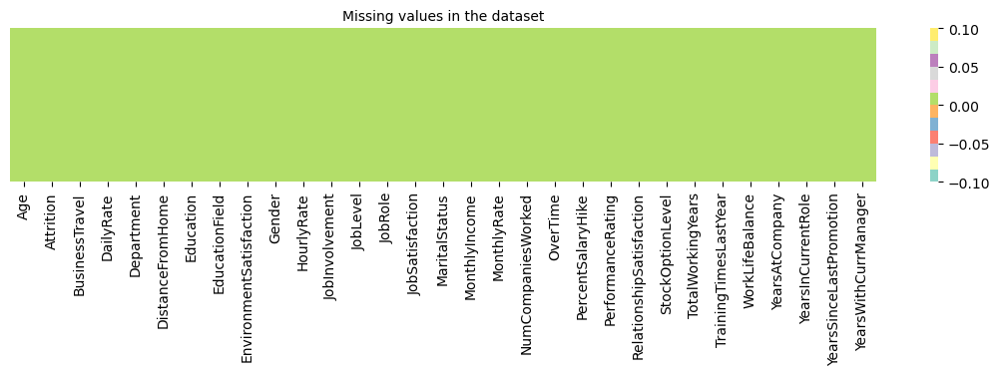

In [10]:
# Let's visualize it using heatmap for dataset
plt.figure(figsize=(14,2))
sns.heatmap(df.isnull(), yticklabels=False, cmap='Set3')
plt.title('Missing values in the dataset', fontsize=10);

In [11]:
# checking the new dimension of the dataset
print(f"The rows and columns in the dataset: {df.shape}")

The rows and columns in the dataset: (1470, 31)


The dataset has 1470 records and 31 columns, out of which 30 are independant variables and attrition is the target variable.

In [12]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


This gives the statistical information of the dataset. The summary of this dataset looks perfect since there is no negative/ invalid values present.

From the above description we can observe the following things.

The counts of all the columns are same which means there are no missing values present in the data. The mean is more than the median(50%) in most of the columns which means they are skewed to right. The min age of the employee is 18 and max is 60 and most of the employees are in between 36. In few columns the median(50%) is more than the mean which means they are skewes to left. By summarising the data above we can infer that DailyRate has a huge outliers from the maximum of 1499 which is quite far from the 75% percentile. These differences we can also be seen in Age, DistanceFromHome, HourlyRate, MonthlyIncome, TotalWorkingYears, YearsAtCompany and many other. Some of the columns have huge difference in mean and the standard deviation.

In [13]:
#Lets go the visualisation part

In [14]:
# Checking the target variable
df['Attrition'].value_counts().to_frame()

,count
Attrition,
No,1233
Yes,237


The target variable has two unique values Yes and No.

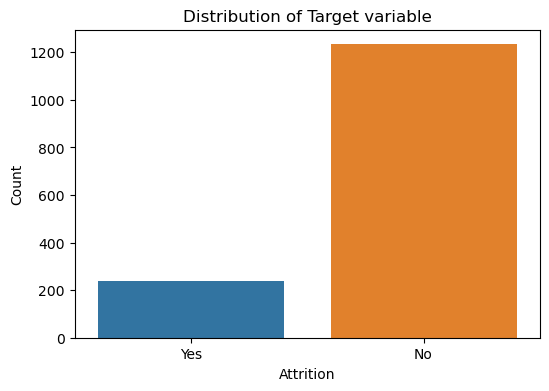

In [15]:
#Visualise the attrition distribution
plt.figure(figsize=(6,4))
ax=sns.countplot(data=df,x='Attrition')
plt.title('Distribution of Target variable')
plt.xlabel('Attrition')
plt.ylabel('Count')
plt.show()

We can see that dataset is imbalanced. We need to rectify it through oversampling method.

BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64


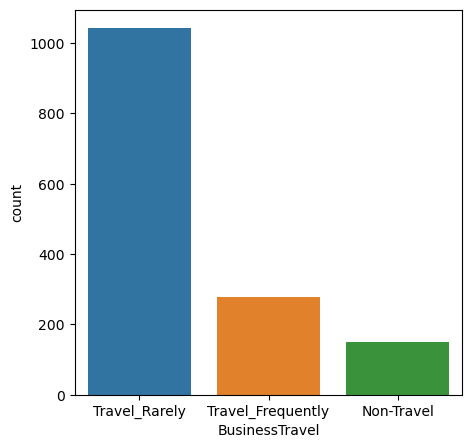

In [16]:
#Visualize the count of employees on the basis of BusinessTravel
print(df["BusinessTravel"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="BusinessTravel")
plt.show()


This graph shows that most of the employees travel rarely and few travel frequently.

Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64


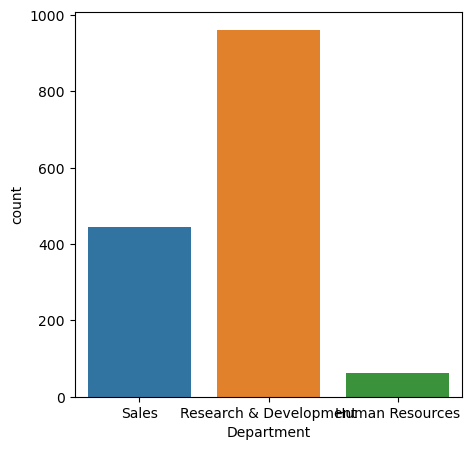

In [17]:
#Visualizing count of Department where the employees are working
print(df["Department"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="Department")
plt.show()

We see from the graph, that employees are higher in count in  Research and Development department when compared to other departments.

EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64


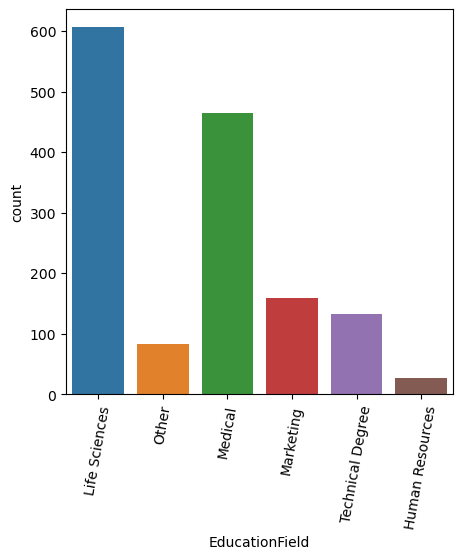

In [18]:
#Visualizing count of Educational fied of the employees
print(df["EducationField"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="EducationField")
plt.xticks(rotation=80)
plt.show()

We cab observe that each and every employees are from different educational field. Here most of the employees are from Life Sciences background followed by Medical field and only few employees are from Human Resources.

Gender
Male      882
Female    588
Name: count, dtype: int64


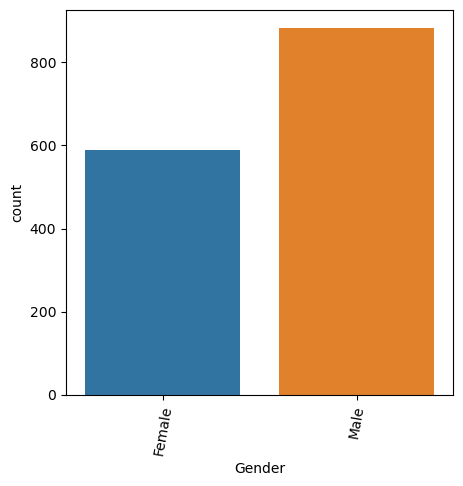

In [19]:
#Visualize the count of Gender
print(df['Gender'].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="Gender")
plt.xticks(rotation=80)
plt.show()

We can observe that male employees are more when compared to female employees.

JobRole
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: count, dtype: int64


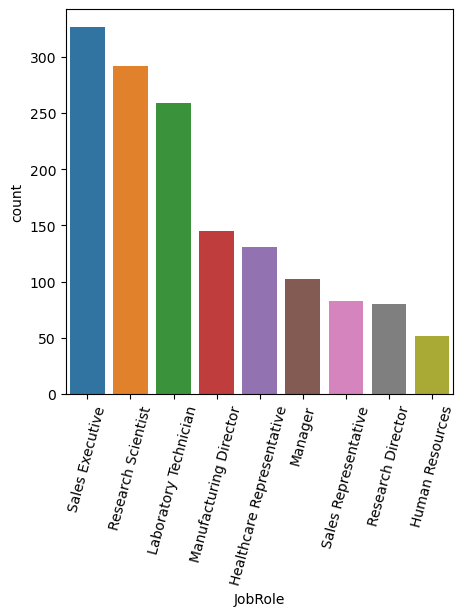

In [20]:
#Visualizing count of JobRole of the employees
print(df["JobRole"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="JobRole")
plt.xticks(rotation=75)
plt.show()

When we observe the various job roles, there are more of sales executive working followed by research scientist and least of Human resources employees.

MaritalStatus
Married     673
Single      470
Divorced    327
Name: count, dtype: int64


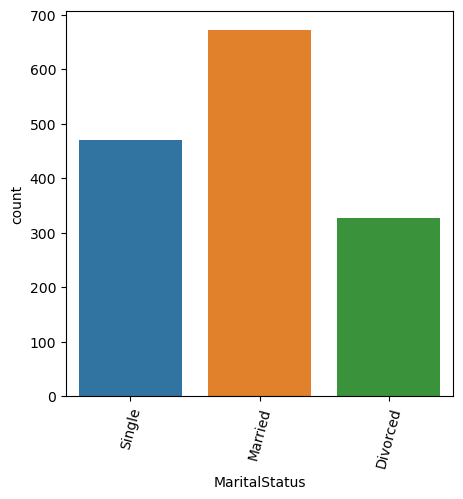

In [21]:
#Visualize the count of marital status of the employees
print(df["MaritalStatus"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="MaritalStatus")
plt.xticks(rotation=75)
plt.show()

We can observe that more of employees are married .

OverTime
No     1054
Yes     416
Name: count, dtype: int64


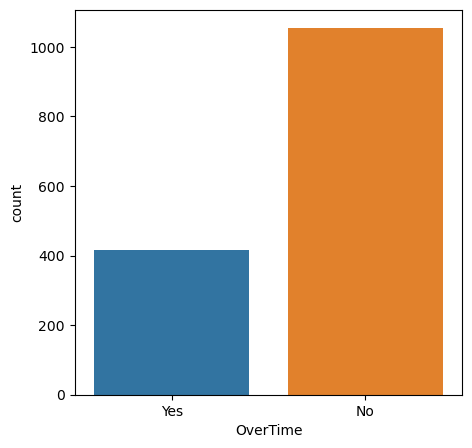

In [22]:
#Visualizing count of Overtime of the employees
print(df["OverTime"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="OverTime")
plt.show()

We can observe that most of the emploees dont work over time, they try to finish up within the stipulated time. 

JobSatisfaction
4    459
3    442
1    289
2    280
Name: count, dtype: int64


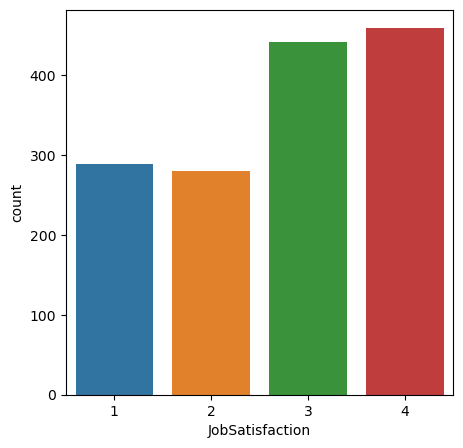

In [23]:
#Visualizing count of job satisfaction of the employees

print(df["JobSatisfaction"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="JobSatisfaction")
plt.show()

NumCompaniesWorked
1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: count, dtype: int64


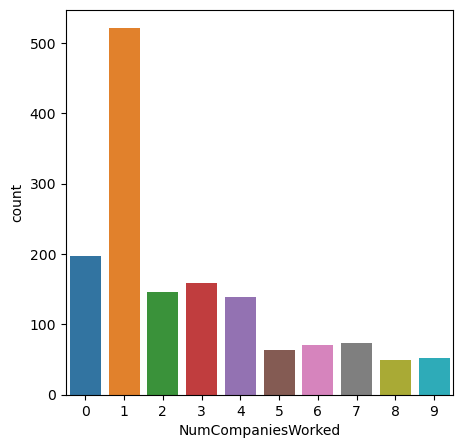

In [24]:
#Visualizing count of number of companies worked by the employees

print(df["NumCompaniesWorked"].value_counts())
plt.figure(figsize=(5,5))
ax=sns.countplot(data=df,x="NumCompaniesWorked")
plt.show()

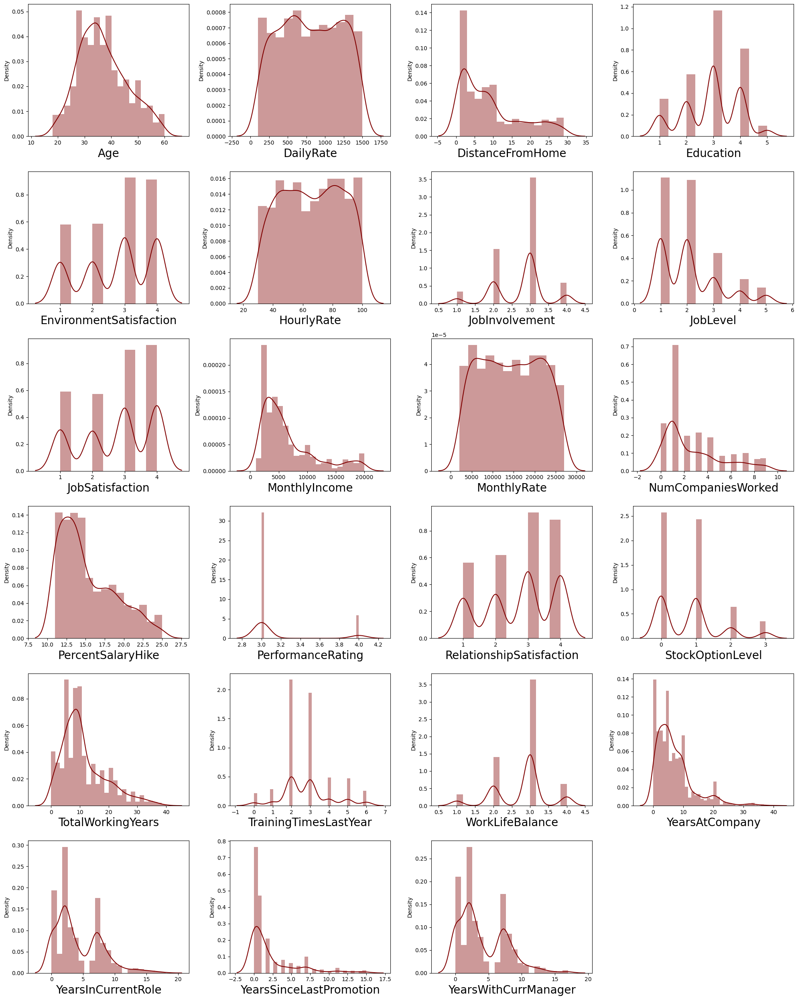

In [25]:
# Checking how the data has been distriubted in each column for numerical columns

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color="maroon")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Text(0.5, 1.0, 'Comparision between Attrition and Age')

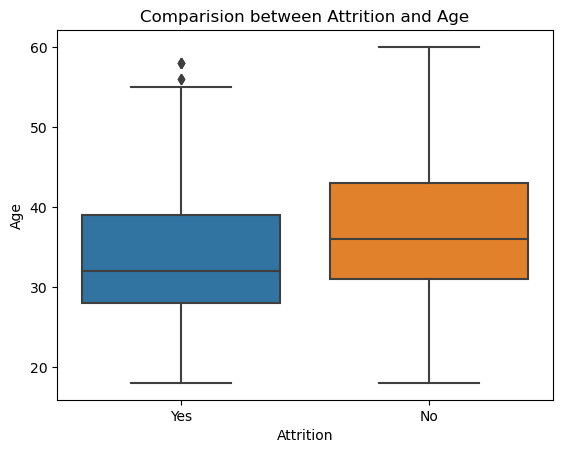

In [26]:
#Bivariate Analysis
#checking the relation between 'Age' and 'Attrition'
sns.boxplot(x='Attrition',y='Age',data=df)
plt.title('Comparision between Attrition and Age')

We can observe that attrition is low in higher age groups.

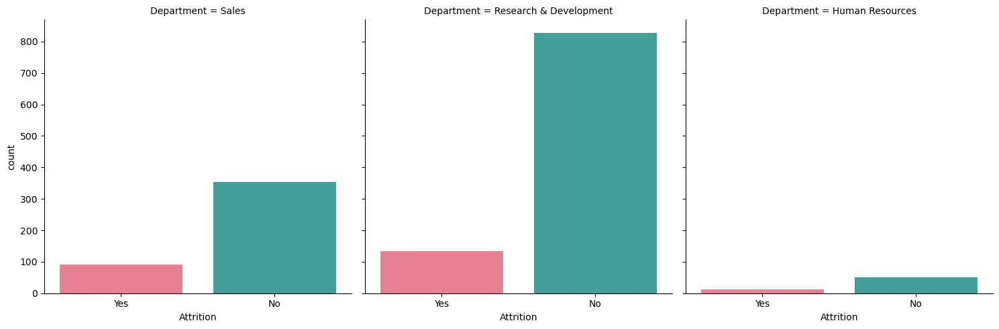

In [27]:
#checking the relation between 'Attrition' and 'Department'
sns.catplot(x='Attrition',col='Department',data=df,kind='count',palette="husl")

We can observe that attrition is more in Research and Development department when compared to other departments.

Text(0.5, 1.0, 'Comparision between Gender and Age based on Attrition')

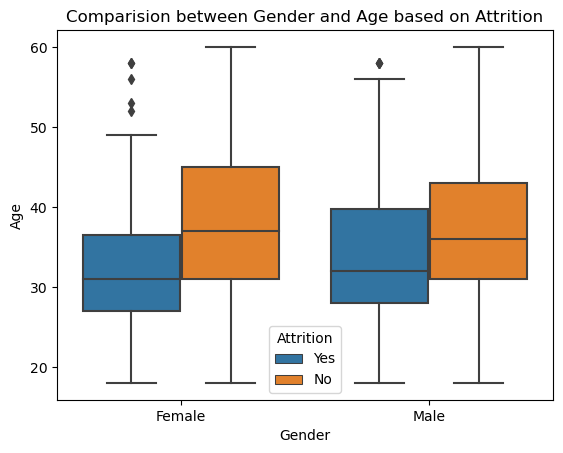

In [28]:
#checking the relation between Gender and Age on the basis of 'Attrition'
sns.boxplot(x='Gender',y='Age',hue='Attrition',data=df)
plt.title('Comparision between Gender and Age based on Attrition')

We tend to observe most of the employees in the age group of 30-40 tend to go for more attrition in both female and male group.

BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64


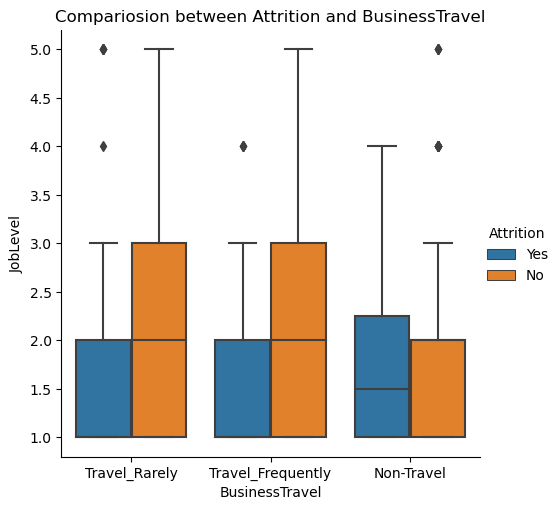

In [29]:
#checking the corelation between 'Attrition' and 'Business Level'
print(df["BusinessTravel"].value_counts())
sns.catplot(x="BusinessTravel",y='JobLevel',data=df,hue="Attrition",kind="box")
plt.title("Compariosion between Attrition and BusinessTravel")
plt.show()

The employees in joblevel 5 who travel rarely don't want to leave the organization and the employees in the joblevel 4 with non business travel are facing attrition.

Education
3    572
4    398
2    282
1    170
5     48
Name: count, dtype: int64


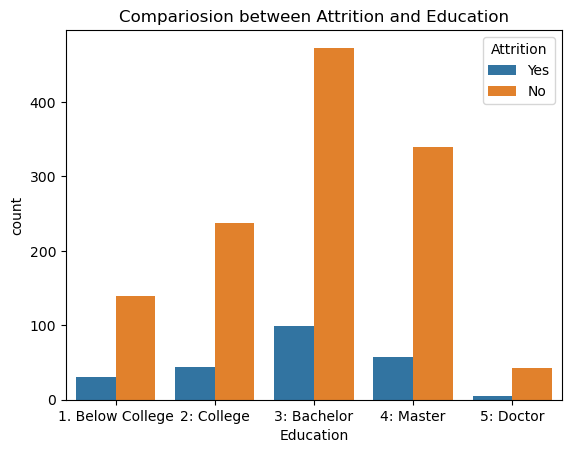

In [30]:
#checking the corelation between 'Attrition' and 'Education'
print(df["Education"].value_counts())
sns.countplot(x="Education",data=df,hue="Attrition")
plt.title("Compariosion between Attrition and Education")
plt.xticks((0, 1, 2, 3, 4), ['1. Below College', '2: College', '3: Bachelor', '4: Master', '5: Doctor'], size=10)

plt.show()

We can observe highest attrition is seen in the level of employees who have completed Bachelor Education.

EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64


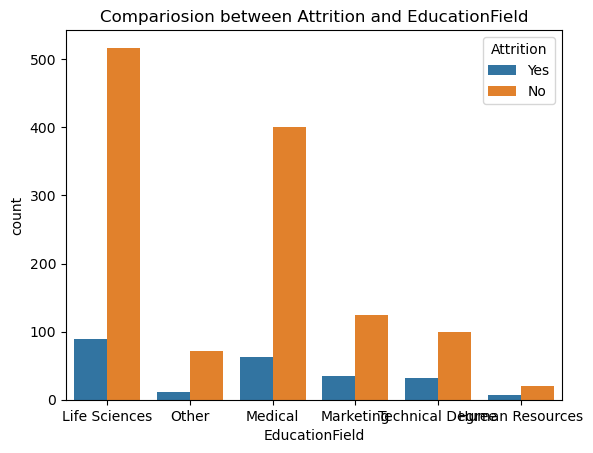

In [31]:
#checking the corelation between 'Attrition' and 'Education Field'
print(df["EducationField"].value_counts())
sns.countplot(x="EducationField",data=df,hue="Attrition")
plt.title("Compariosion between Attrition and EducationField")
plt.show()

We can observe that attrition level is significant in employees who are from life science education background.

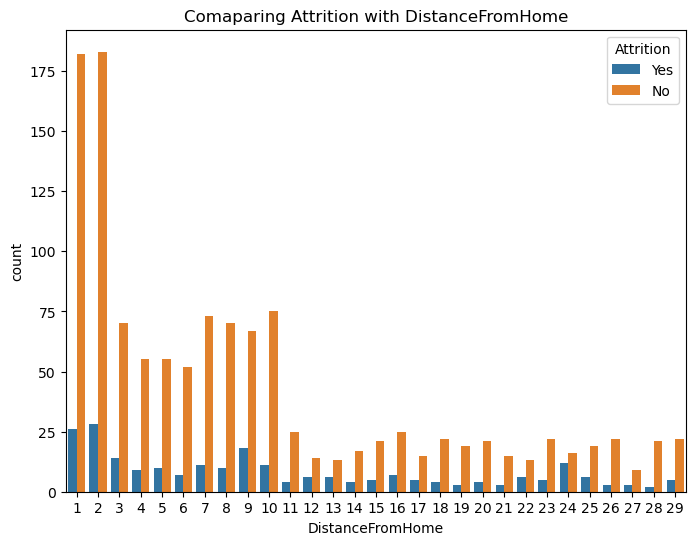

In [32]:
#Checking the corelation between 'Attrition' and travel distance
plt.figure(figsize=(8,6))
plt.title("Comaparing Attrition with DistanceFromHome")
sns.countplot(x=df['DistanceFromHome'],hue=df["Attrition"],data=df)
plt.show()

It can be clearly observed from the plot that highest employees stay close to the workplace but still face attrition when compared to employees who are far away from the office.

DailyRate
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: count, Length: 886, dtype: int64


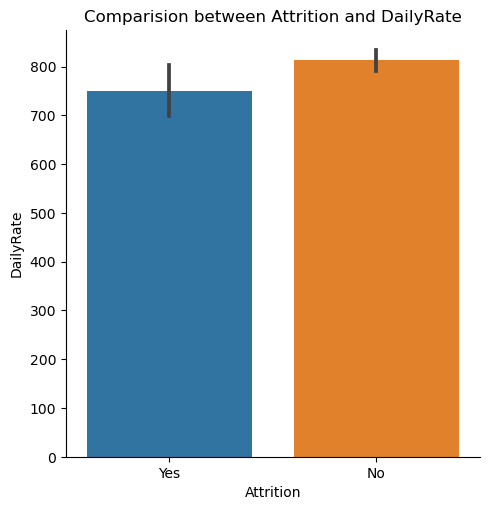

In [33]:
# Checking attrition level in Dailyrate
print(df["DailyRate"].value_counts())
sns.catplot(x="Attrition",y='DailyRate',data=df,kind="bar")
plt.title("Comparision between Attrition and DailyRate")
plt.show()

We can observe that employees with low daily rate want to leave the organization when compared to high daily rate.

HourlyRate
66    29
98    28
42    28
48    28
84    28
      ..
31    15
53    14
68    14
38    13
34    12
Name: count, Length: 71, dtype: int64


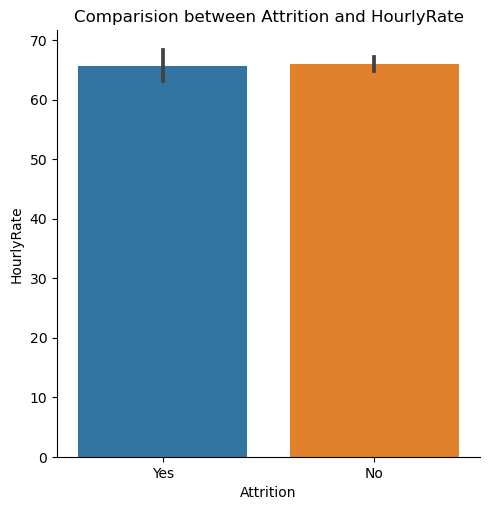

In [34]:
# Checking attrition level in HourlyRate
print(df["HourlyRate"].value_counts())
sns.catplot(x="Attrition",y='HourlyRate',data=df,kind="bar")
plt.title("Comparision between Attrition and HourlyRate")
plt.show()

We can observe that we dont see much difference in the hourly rate and attrition.

MonthlyRate
4223     3
9150     3
9558     2
12858    2
22074    2
        ..
14561    1
2671     1
5718     1
11757    1
10228    1
Name: count, Length: 1427, dtype: int64


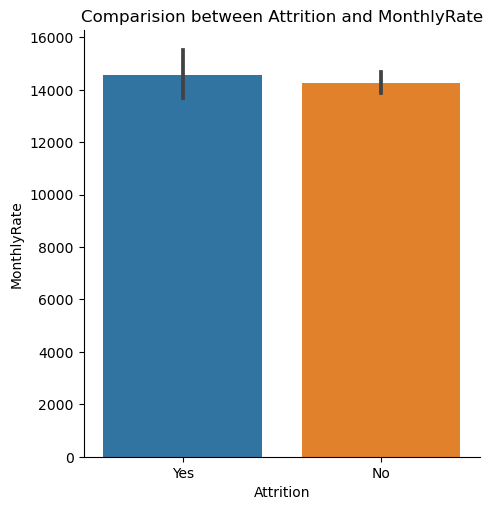

In [35]:
# Checking attrition level in Monthlyrate
print(df["MonthlyRate"].value_counts())
sns.catplot(x="Attrition",y='MonthlyRate',data=df,kind="bar")
plt.title("Comparision between Attrition and MonthlyRate")
plt.show()

We can observe slight higher side for monthly rate attrition level.

MonthlyIncome
2342     4
6142     3
2741     3
2559     3
2610     3
        ..
7104     1
2773     1
19513    1
3447     1
4404     1
Name: count, Length: 1349, dtype: int64


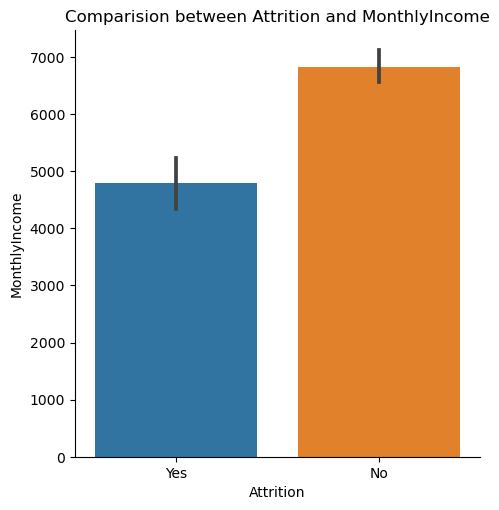

In [36]:
# Checking attrition level in Monthlyincome
print(df["MonthlyIncome"].value_counts())
sns.catplot(x="Attrition",y='MonthlyIncome',data=df,kind="bar")
plt.title("Comparision between Attrition and MonthlyIncome")
plt.show()

We can observe there is more of attrition for the monthly salary below 5000.

EnvironmentSatisfaction
3    453
4    446
2    287
1    284
Name: count, dtype: int64


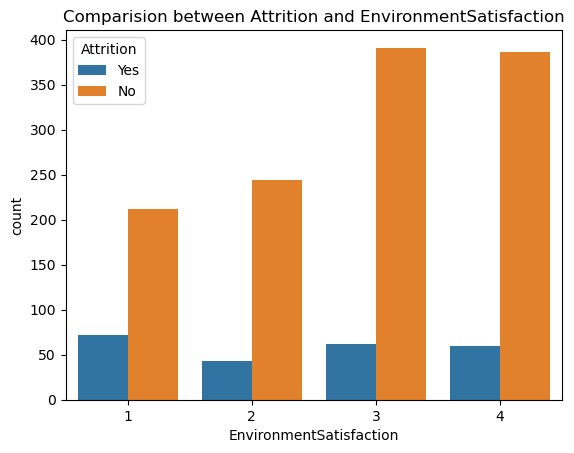

In [37]:
# Checking the counts of EnvironmentSatisfaction
print(df["EnvironmentSatisfaction"].value_counts())
ax=sns.countplot(x='EnvironmentSatisfaction',hue='Attrition',data=df)
plt.title("Comparision between Attrition and EnvironmentSatisfaction")
plt.show()

Observation: We can notice that the relative percent of "No" attrition in employees with high EnvironmentSatisfaction in the above plot. Which means the employees having low EnvironmentSatisfaction wants to leave the company.

JobInvolvement
3    868
2    375
4    144
1     83
Name: count, dtype: int64


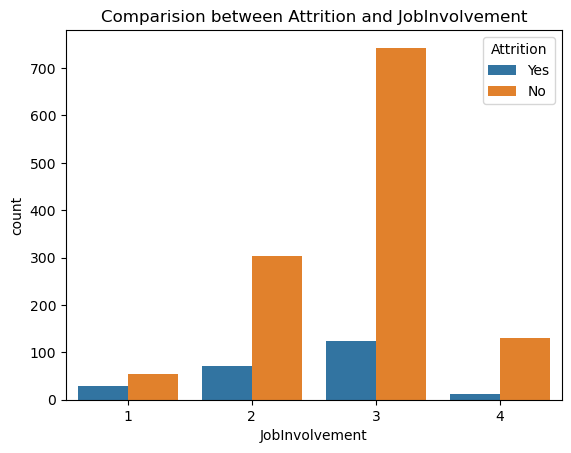

In [38]:
# Checking the counts of JobInvolvement
print(df["JobInvolvement"].value_counts())
ax=sns.countplot(x='JobInvolvement',hue='Attrition',data=df)
plt.title("Comparision between Attrition and JobInvolvement")
plt.show()


We can observe that the employees whose level of job involvement is low are leaving the organisation.

JobSatisfaction
4    459
3    442
1    289
2    280
Name: count, dtype: int64


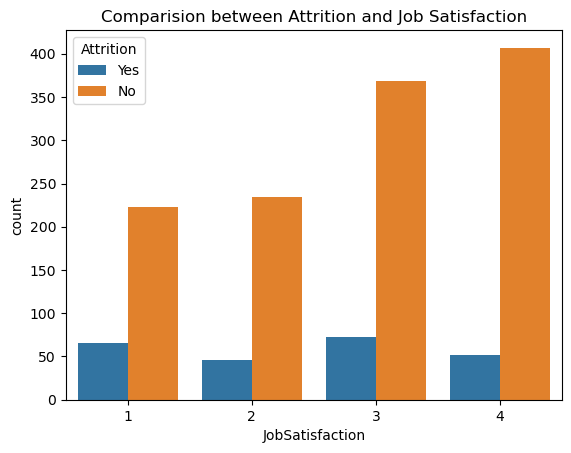

In [39]:
# Checking the counts of JobSatisfaction
print(df["JobSatisfaction"].value_counts())
ax=sns.countplot(x='JobSatisfaction',hue='Attrition',data=df)
plt.title("Comparision between Attrition and Job Satisfaction")
plt.show()

We can observe that people with low job satisfaction level have more attrition rate. 

RelationshipSatisfaction
3    459
4    432
2    303
1    276
Name: count, dtype: int64


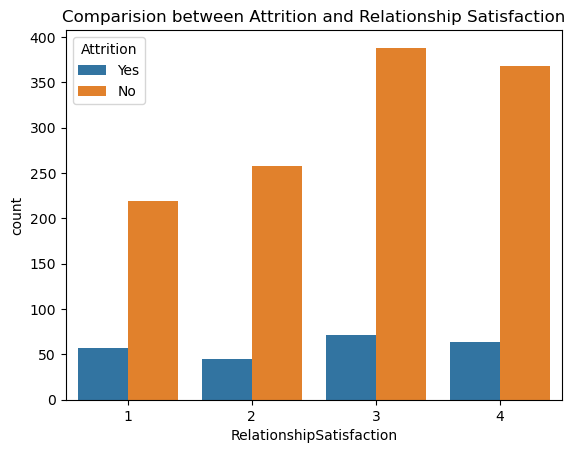

In [40]:
# Checking the counts of RelationshipSatisfaction
print(df["RelationshipSatisfaction"].value_counts())
ax=sns.countplot(x='RelationshipSatisfaction',hue='Attrition',data=df)
plt.title("Comparision between Attrition and Relationship Satisfaction")
plt.show()

We can observe that employees having higher relationship satisfaction has more of attrition level.

WorkLifeBalance
3    893
2    344
4    153
1     80
Name: count, dtype: int64


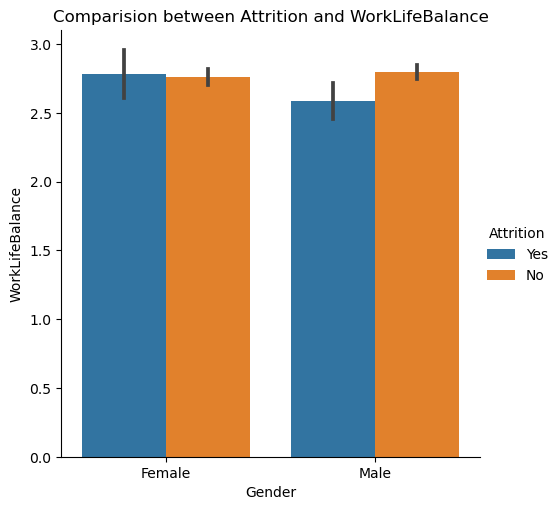

In [41]:
# Checking attrition level in WorkLifeBalance
print(df["WorkLifeBalance"].value_counts())
sns.catplot(x='Gender',y='WorkLifeBalance',data=df,kind="bar",hue='Attrition')
plt.title("Comparision between Attrition and WorkLifeBalance")
plt.show()


We can observe that female employees with worklife balance face attrition.

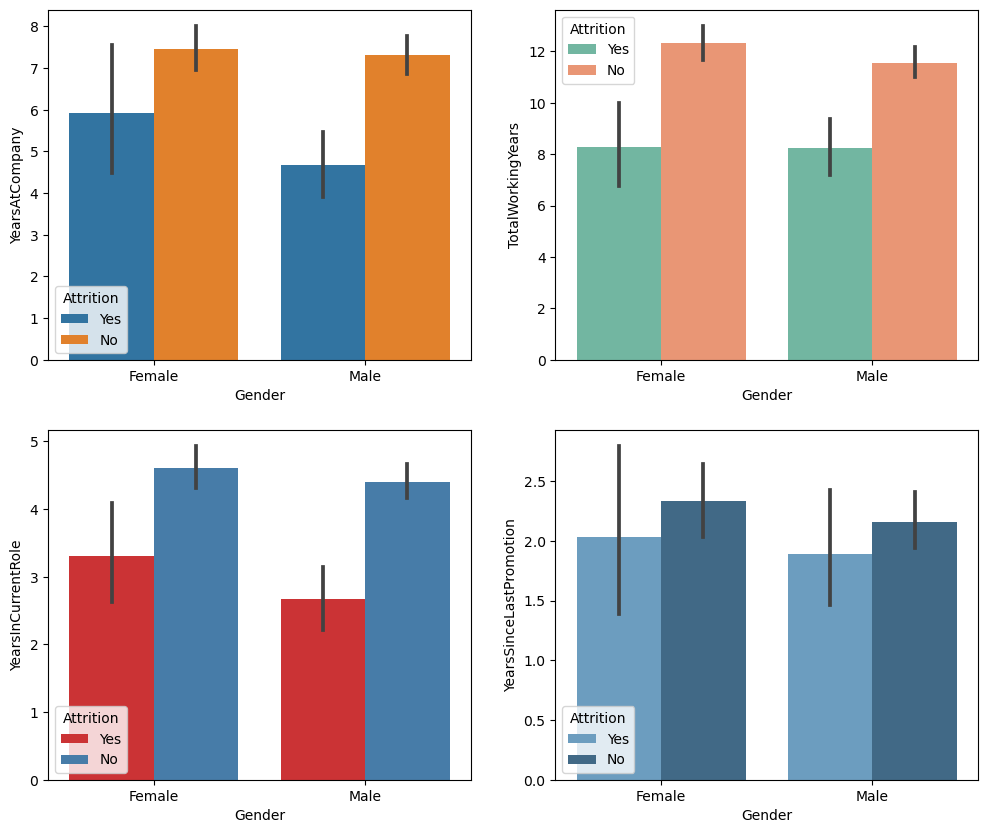

In [42]:
fig,axes=plt.subplots(2,2,figsize=(12,10))

# Checking attrition level in YearsAtCompany
sns.barplot(x='Gender',y='YearsAtCompany',ax=axes[0,0],data=df,hue='Attrition')

# Checking attrition level in TotalWorkingYears
sns.barplot(x='Gender',y='TotalWorkingYears',ax=axes[0,1],data=df,hue='Attrition',palette="Set2")

# Checking attrition level in YearsInCurrentRole
sns.barplot(x='Gender',y='YearsInCurrentRole',ax=axes[1,0],data=df,hue='Attrition',palette="Set1")

# Checking attrition level in YearsSinceLastPromotion
sns.barplot(x='Gender',y='YearsSinceLastPromotion',ax=axes[1,1],data=df,hue='Attrition',palette="Blues_d")
plt.show()

We can observe that female employees are working more in current role and also holding on to job in the same company, but their attrition level is also high when compared to male employees. 

PerformanceRating
3    1244
4     226
Name: count, dtype: int64


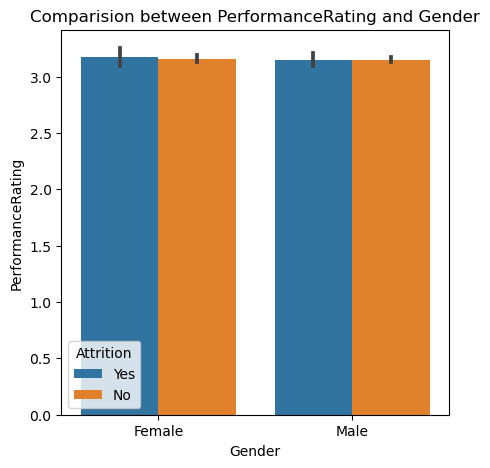

In [43]:
# Let's check how the performance rating afecting the attrition level
print(df["PerformanceRating"].value_counts())
plt.figure(figsize=(5,5))
sns.barplot(x='Gender',y='PerformanceRating',data=df,hue=df['Attrition'])
plt.title("Comparision between PerformanceRating and Gender")
plt.show()

We can observe that we dont find much difference in the performance rating in both male and female employees, but we can say that attrition is affecting them equally.

PercentSalaryHike
11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: count, dtype: int64


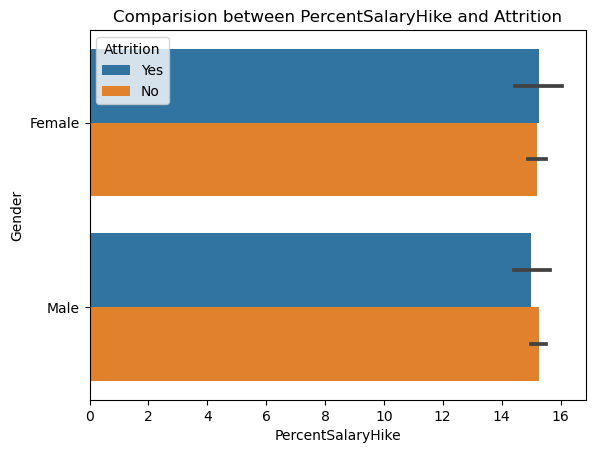

In [44]:
# Let's check how the attrition afecting the PercentSalaryHike level
print(df["PercentSalaryHike"].value_counts())
sns.barplot(x="PercentSalaryHike",y="Gender",hue="Attrition", data=df)
plt.title("Comparision between PercentSalaryHike and Attrition")
plt.show()


We can observe that salary hike doesnt affect the attrition level in both the genders.

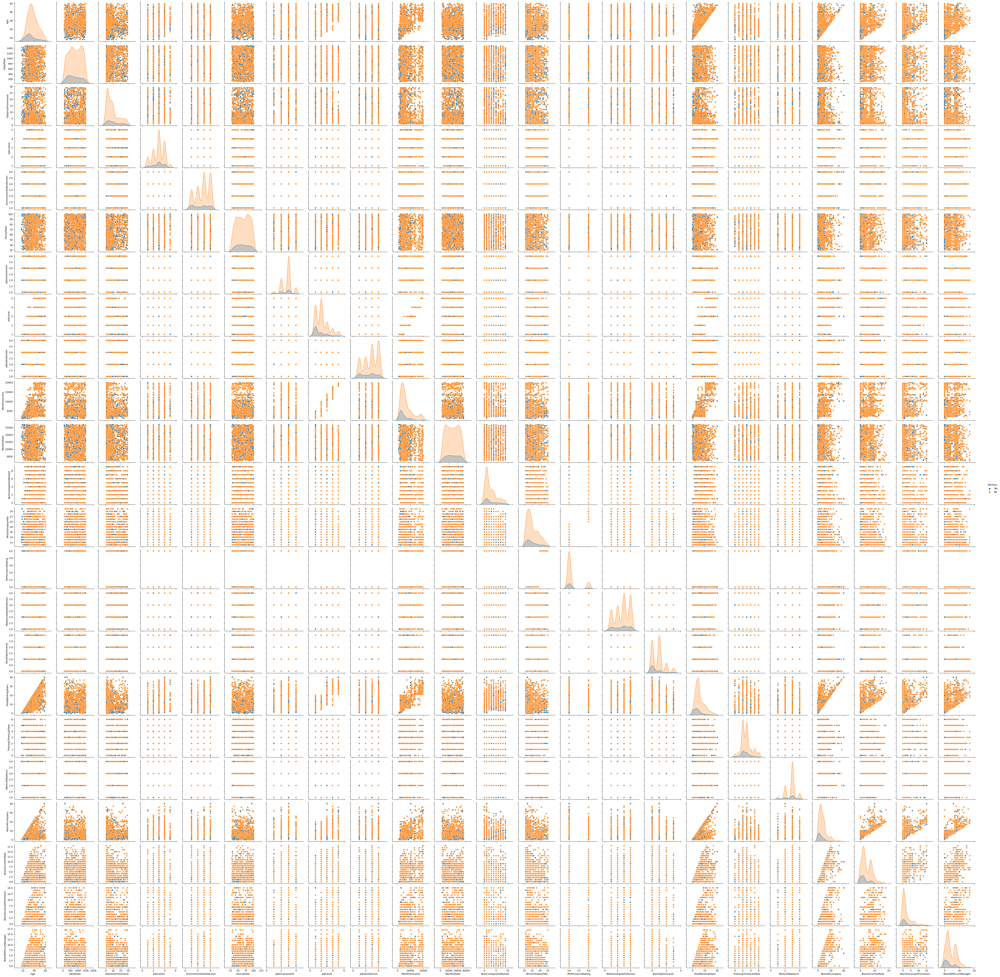

In [45]:
#Multivariate Analysis
# Checking the pairwise relation in the dataset.
sns.pairplot(df,hue="Attrition")

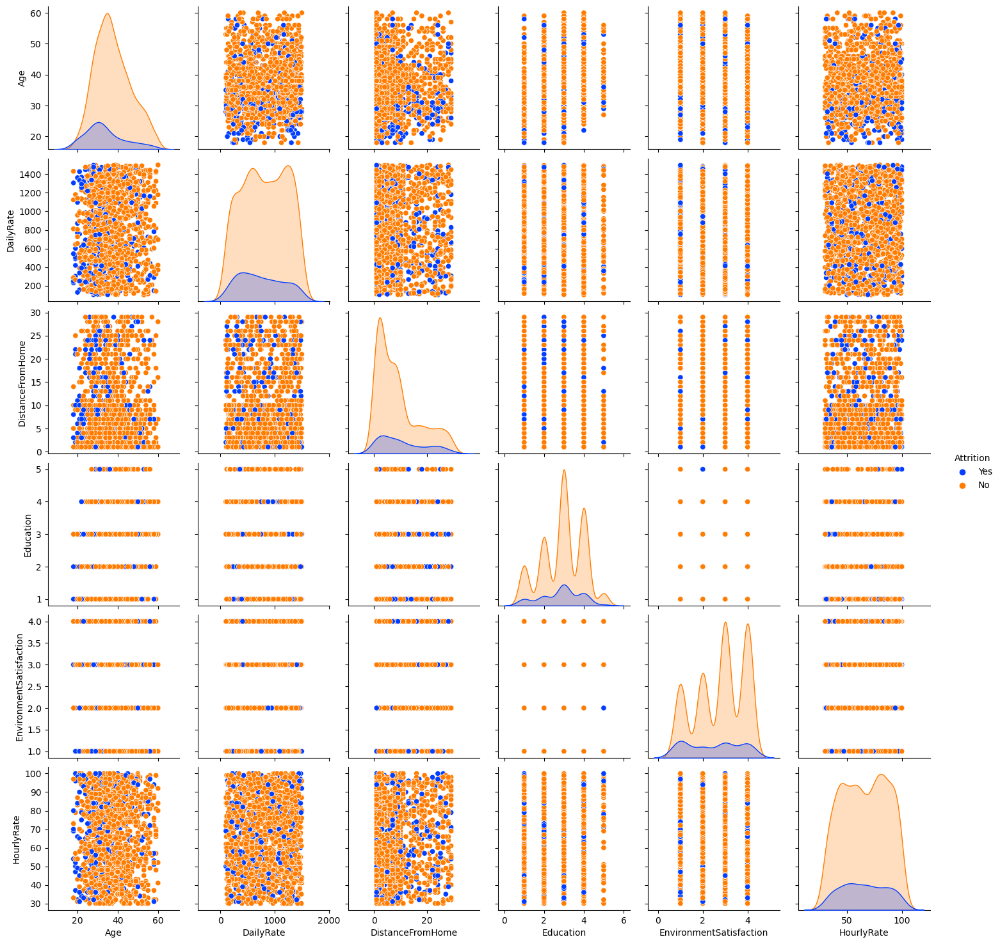

In [46]:
# First 10 columns
grid = sns.pairplot(df.iloc[:,:11], hue = "Attrition", palette = "bright")


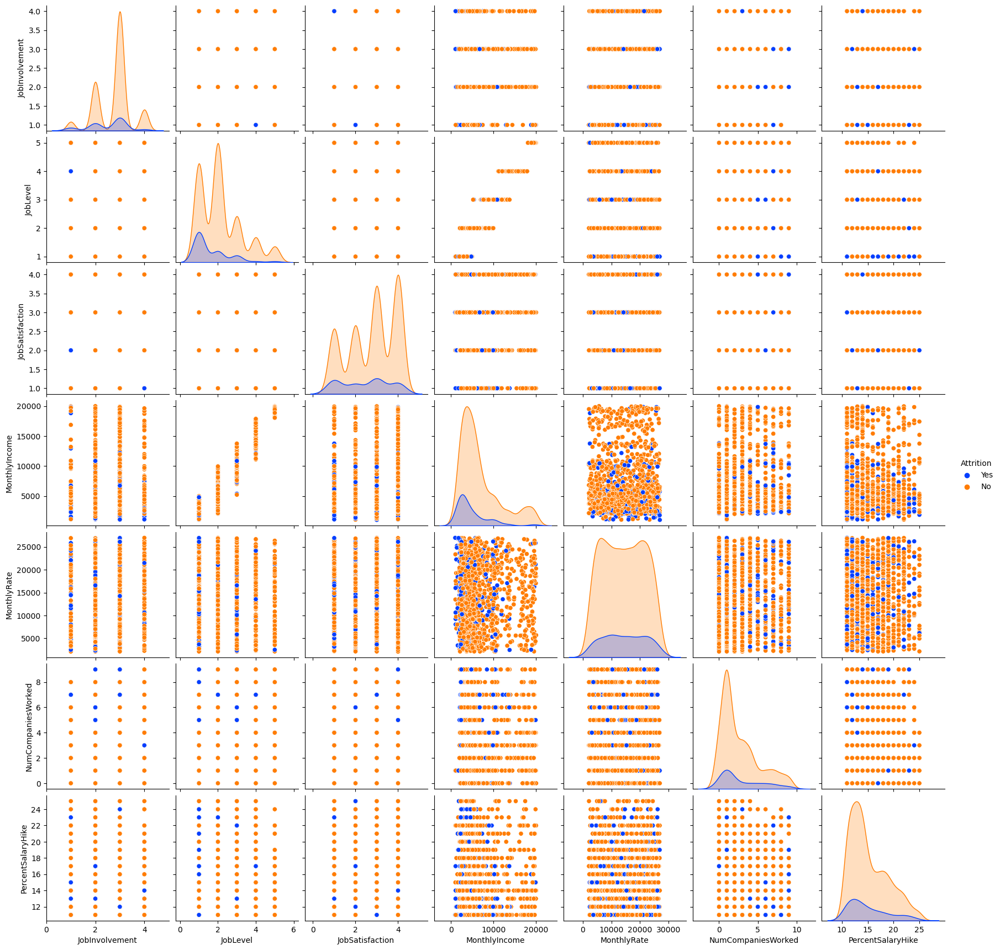

In [47]:
# Next 10 columns
df_pairplot = df.iloc[:,11:21]
df_pairplot['Attrition'] = df['Attrition']

grid = sns.pairplot(df_pairplot, hue = "Attrition", palette = "bright")


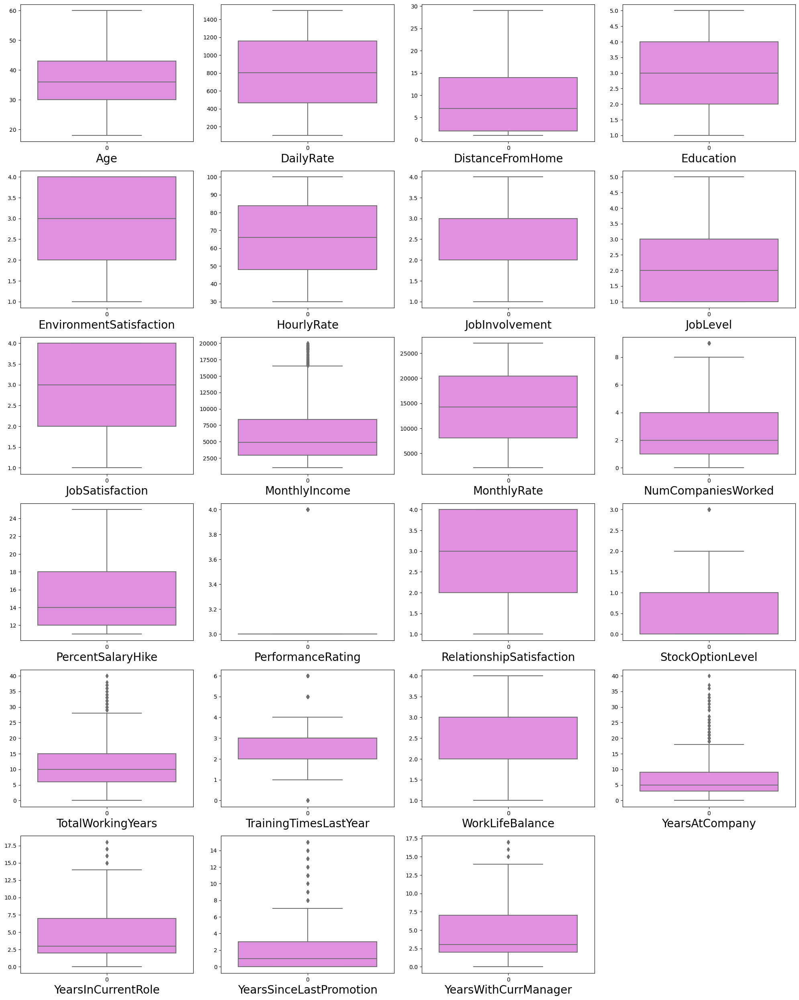

In [48]:
# Identifying the outliers using boxplot

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],color="violet")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()


Outliers present in the columns MonthlyIncome, NumCompaniesWorked, performanceRating, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion and YearsWithCurrManager. We will remove these outliers using either Zscore.

In [49]:
#Removing Outliers
# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print(numerical_col)

['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


In [50]:
#ZScore Method
# Features containing outliers
features = df[['MonthlyIncome','NumCompaniesWorked','PerformanceRating','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']]
# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

,MonthlyIncome,NumCompaniesWorked,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.108350,2.125136,0.426230,0.932014,0.421642,2.171982,0.164613,0.063296,0.679146,0.245834
1,0.291719,0.678049,2.346151,0.241988,0.164511,0.155707,0.488508,0.764998,0.368715,0.806541
2,0.937654,1.324226,0.426230,0.932014,0.550208,0.155707,1.144294,1.167687,0.679146,1.155935
3,0.763634,0.678049,0.426230,0.932014,0.421642,0.155707,0.161947,0.764998,0.252146,1.155935
4,0.644858,2.525591,0.426230,0.241988,0.678774,0.155707,0.817734,0.615492,0.058285,0.595227
...,...,...,...,...,...,...,...,...,...,...
1465,0.835451,0.523316,0.426230,0.241988,0.735447,0.155707,0.327893,0.615492,0.679146,0.314873
1466,0.741140,0.523316,0.426230,0.241988,0.293077,1.707500,0.001333,0.764998,0.368715,0.806541
1467,0.076690,0.678049,2.346151,0.241988,0.678774,2.171982,0.164613,0.615492,0.679146,0.314873
1468,0.236474,0.277594,0.426230,0.932014,0.735447,0.155707,0.325228,0.488900,0.679146,1.086895


In [51]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)] 
new_df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


In [52]:
# Shape of original dataset
df.shape

(1470, 31)

In [53]:
new_df.shape

(1387, 31)

In [54]:
#Encoding the the categorical column using label encoding
categorical_col = ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']

In [55]:
LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [56]:
new_df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,3,1,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,4,1,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2,1,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,4,1,...,3,4,0,17,3,2,9,6,0,8


In [57]:
#Checking Skewness
new_df.skew().sort_values()

BusinessTravel             -1.426774
WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
Gender                     -0.417296
JobRole                    -0.386843
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
MaritalStatus              -0.160952
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
Department                  0.183919
Age                         0.472280
EducationField              0.544868
TrainingTimesLastYear       0.577614
YearsWithCurrManager        0.694506
YearsInCurrentRole          0.726675
PercentSalaryHike           0.800592
OverTime                    0.954751
DistanceFromHome            0.954752
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
NumCompaniesWorked          1.037715
JobLevel                    1.126075
YearsAtCompany              1.248623
M

The columns containing skewness more than +0.5 and -0.5 are

DistanceFromHome, JobInvolvement,JobLevel, MonthlyIncome, NumCompaniesWorked ,PercentSalaryHike ,PerformanceRating ,StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, WorkLifeBalance, YearsAtCompany ,YearsInCurrentRole, YearsWithCurrManager so no need to remove skewness in these columns.

In [58]:

# Removing skewness using yeo-johnson  method to get better prediction
skew = ['DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [59]:
new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()


,DistanceFromHome,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
0,-1.489968,0.349828,0.386674,1.620671,-1.495549,-1.084263,-0.173231,-2.608524,0.231837,0.290524,0.582177
1,0.244561,0.349828,0.144235,-0.561880,1.690425,0.548653,0.147620,0.217074,0.948319,1.006575,1.018073
2,-1.028366,-1.141761,-1.431153,1.273711,0.193797,-1.084263,-0.351153,0.217074,-2.156089,-1.571814,-1.528426
3,-0.698191,-1.141761,-0.814425,-0.561880,-1.495549,-1.084263,-0.173231,0.217074,0.621429,1.006575,-1.528426
4,-1.028366,-1.141761,-0.504453,1.764103,-0.957525,0.548653,-0.544046,0.217074,-0.933983,-0.390769,-0.347871


In [60]:
new_df.skew().sort_values()

BusinessTravel             -1.426774
WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
Gender                     -0.417296
JobRole                    -0.386843
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
MaritalStatus              -0.160952
YearsWithCurrManager       -0.070570
YearsInCurrentRole         -0.069631
HourlyRate                 -0.030481
YearsAtCompany             -0.025230
DailyRate                  -0.017078
TotalWorkingYears          -0.009666
DistanceFromHome           -0.008149
NumCompaniesWorked          0.016175
MonthlyIncome               0.027700
MonthlyRate                 0.030596
TrainingTimesLastYear       0.057949
StockOptionLevel            0.089929
JobLevel                    0.110769
PercentSalaryHike           0.112128
Department                  0.183919
Age                         0.472280
EducationField              0.544868
O

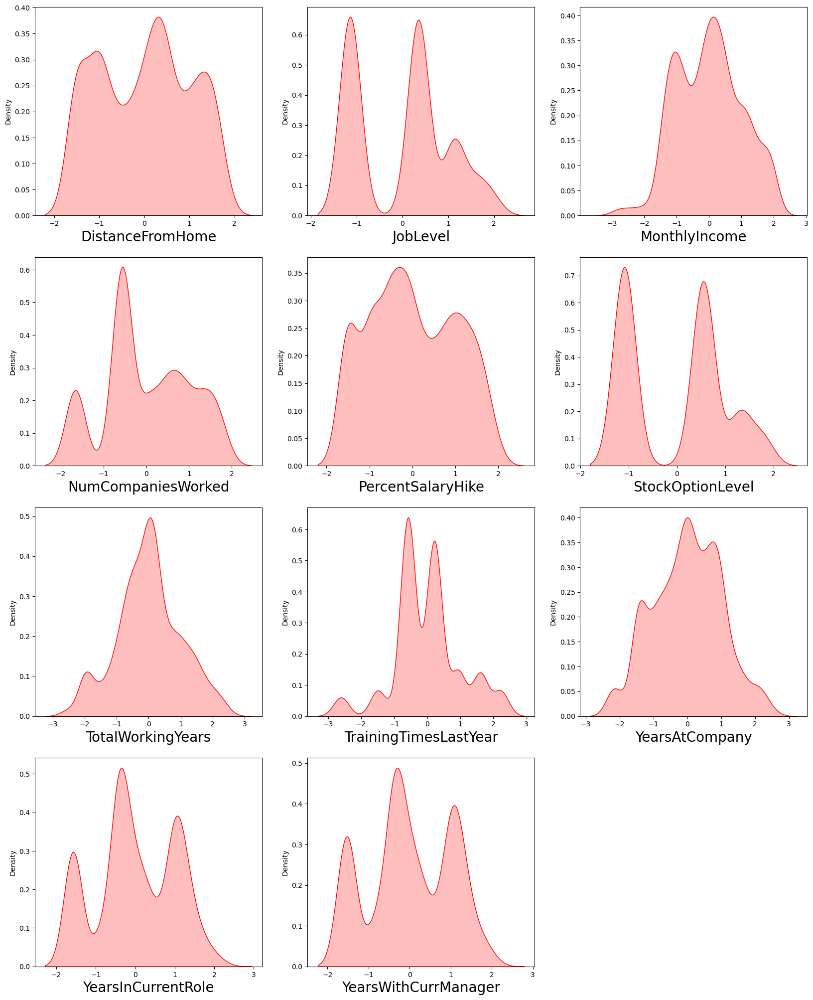

In [61]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=12:
        ax = plt.subplot(4,3,plotnumber)
        sns.distplot(new_df[column],color='red',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

Data Looks normal since the skewness was addressed.

In [62]:
# Checking the correlation between features and the target
cor = new_df.corr()
cor


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.028793,0.198502,-0.032676,0.014098,-0.039430,...,-0.000617,0.041744,0.077833,0.634884,-0.013707,-0.016913,0.174149,0.118454,0.103632,0.114962
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.080979,-0.032703,0.023585,-0.112393,0.036252,...,0.010781,-0.052344,-0.175081,-0.220878,-0.059071,-0.062492,-0.201954,-0.187047,-0.029263,-0.186821
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.015034,-0.010560,0.022576,0.001183,-0.025364,...,-0.018274,-0.029660,-0.012732,0.031888,0.011688,-0.014140,-0.021107,-0.032472,-0.027283,-0.033222
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.003967,-0.018442,0.040645,0.033123,-0.005242,...,0.000574,0.004516,0.047773,0.043307,0.006581,-0.044266,0.005806,0.020542,-0.043870,0.007098
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.037660,0.012846,0.013432,-0.014540,-0.030618,...,-0.039364,-0.037705,-0.001271,-0.007789,0.039412,0.026978,0.026334,0.057983,0.048931,0.023995
DistanceFromHome,-0.028793,0.080979,-0.015034,-0.003967,0.037660,1.000000,0.003595,0.011891,-0.012075,0.010557,...,0.013212,0.010099,0.027082,-0.012129,-0.015334,-0.027681,0.006570,0.013091,-0.003226,-0.002310
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.003595,1.000000,-0.038017,-0.026223,-0.019166,...,-0.023487,-0.002393,0.026805,0.152263,-0.023484,0.007844,0.038266,0.050563,0.042517,0.026340
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.011891,-0.038017,1.000000,0.047924,0.010676,...,-0.003621,-0.013734,-0.017331,-0.008101,0.048844,0.034038,0.002739,0.002909,0.034094,0.025918
EnvironmentSatisfaction,0.014098,-0.112393,0.001183,0.033123,-0.014540,-0.012075,-0.026223,0.047924,1.000000,-0.015715,...,-0.025299,0.018414,0.025227,-0.014091,-0.016757,0.032492,0.014305,0.031007,0.027943,0.007643
Gender,-0.039430,0.036252,-0.025364,-0.005242,-0.030618,0.010557,-0.019166,0.010676,-0.015715,1.000000,...,-0.010757,0.041458,0.024390,-0.049776,-0.039213,0.000134,-0.046018,-0.028101,-0.028162,-0.027972


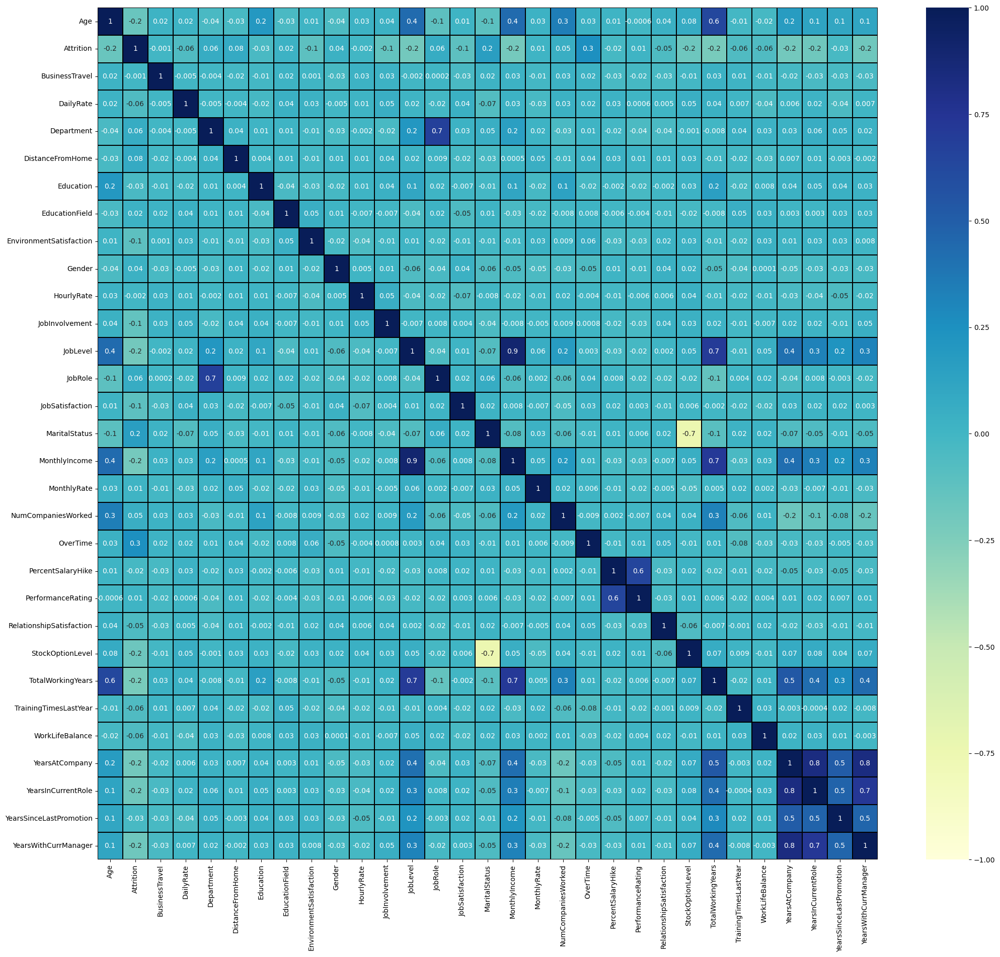

In [63]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,22))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="YlGnBu")
plt.yticks(rotation=0);

This heatmap shows the correlation matrix. We can observe the relation between feature to feature and feature to label.

This heatmap contains both positive and negative correlations.
The target has more correlation with DistanceFromHome(+0.08)
The target is negative correlated with TotalWorkingYears(-0.17)
The column JobLevel is correlated with MonthlyIncome(+0.9), and TotalWorkingYears(+0.7)
The column Age is positive correlated with TotalWorkingYears(+0.6)
The columns YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager, and TotalWorkingYears are correlated with each other.
We dont see much multicolinearity in the data.

In [64]:
cor['Attrition'].sort_values(ascending=False)

Attrition                   1.000000
OverTime                    0.257237
MaritalStatus               0.160960
DistanceFromHome            0.080979
JobRole                     0.064283
Department                  0.063637
NumCompaniesWorked          0.047508
Gender                      0.036252
EducationField              0.023585
MonthlyRate                 0.014888
PerformanceRating           0.010781
BusinessTravel             -0.001041
HourlyRate                 -0.001532
PercentSalaryHike          -0.017523
YearsSinceLastPromotion    -0.029263
Education                  -0.032703
RelationshipSatisfaction   -0.052344
DailyRate                  -0.057220
TrainingTimesLastYear      -0.059071
WorkLifeBalance            -0.062492
EnvironmentSatisfaction    -0.112393
JobSatisfaction            -0.114206
JobInvolvement             -0.133957
Age                        -0.159366
StockOptionLevel           -0.175081
YearsWithCurrManager       -0.186821
YearsInCurrentRole         -0.187047
J

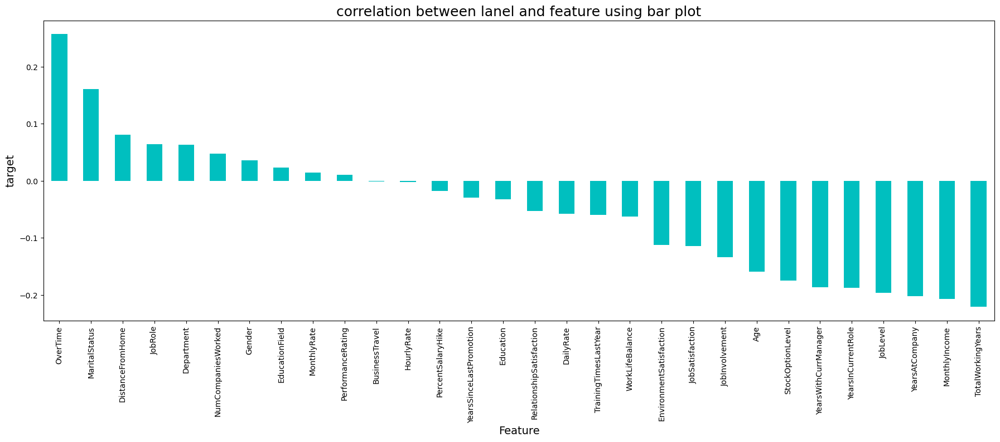

In [65]:
#Visualising the correlation between the target and independant variable
plt.figure(figsize=(22,7))
new_df.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()


We can observe that hourly rate and hourly rate doesnt relationship with the target. Lets drop those columns.

In [66]:
#Dropping irrelevant columns.
new_df.drop('BusinessTravel',axis=1,inplace=True)
new_df.drop('HourlyRate',axis=1,inplace=True)


In [67]:
new_df.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,-1.489968,2,1,2,0,3,...,3,1,-1.084263,-0.173231,-2.608524,1,0.231837,0.290524,0,0.582177
1,49,0,279,1,0.244561,1,1,3,1,2,...,4,4,0.548653,0.147620,0.217074,3,0.948319,1.006575,1,1.018073
2,37,1,1373,1,-1.028366,2,4,4,1,2,...,3,2,-1.084263,-0.351153,0.217074,3,-2.156089,-1.571814,0,-1.528426
3,33,0,1392,1,-0.698191,4,1,4,0,3,...,3,3,-1.084263,-0.173231,0.217074,3,0.621429,1.006575,3,-1.528426
4,27,0,591,1,-1.028366,1,3,1,1,3,...,3,4,0.548653,-0.544046,0.217074,3,-0.933983,-0.390769,2,-0.347871


In [68]:
#Separating the features and targets.
x=new_df.drop('Attrition',axis=1)
y=new_df['Attrition']


In [69]:
#Dimensions of x
x.shape

(1387, 28)

In [70]:
#Dimensions of y
y.shape

(1387,)

In [71]:
y.value_counts()

Attrition
0    1158
1     229
Name: count, dtype: int64

#Oversampling - since the y value dataset seems to be imbalanced.


In [74]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1, y1 = SM.fit_resample(x, y)


In [75]:
y1.value_counts()


Attrition
1    1158
0    1158
Name: count, dtype: int64

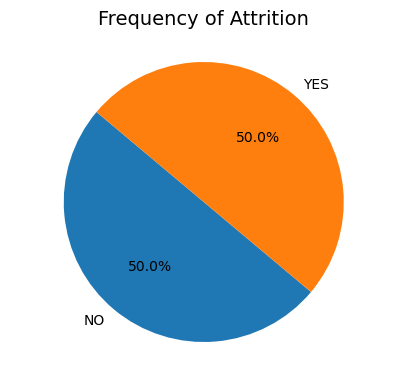

In [77]:
# Count the frequencies of target
target_counts = y1.value_counts()

# Create a pie plot
plt.figure(figsize=(5, 4))
plt.pie(target_counts, labels=['NO', 'YES'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Attrition", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [78]:
x=x1
y=y1

In [79]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.726820,0.826619,1.601712,-1.660398,-0.768012,-0.915340,-0.431945,-1.046866,0.668360,0.565425,...,-0.332053,-1.440935,-0.967443,0.039341,-2.742174,-2.181719,0.435526,0.493254,-0.688814,0.793606
1,1.659406,-1.268794,-0.344545,0.189654,-1.801548,-0.915340,0.495196,0.955232,-0.674156,0.565425,...,3.011572,1.436793,0.749710,0.365080,0.275384,0.555476,1.177317,1.247502,-0.255664,1.246676
2,0.260528,1.516603,-0.344545,-1.168053,-0.768012,1.465709,1.422337,0.955232,-0.674156,-1.019396,...,-0.332053,-0.481692,-0.967443,-0.141291,0.275384,0.555476,-2.036748,-1.468431,-0.688814,-1.400153
3,-0.205765,1.564978,-0.344545,-0.815887,1.299060,-0.915340,1.422337,-1.046866,0.668360,-1.019396,...,-0.332053,0.477551,-0.967443,0.039341,0.275384,0.555476,0.838880,1.247502,0.610638,-1.400153
4,-0.905204,-0.474422,-0.344545,-1.168053,-1.801548,0.672026,-1.359087,0.955232,0.668360,-1.019396,...,-0.332053,1.436793,0.749710,-0.337122,0.275384,0.555476,-0.771473,-0.224383,0.177487,-0.173085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,-0.555484,0.419248,1.601712,0.321704,0.265524,-0.121657,-1.359087,0.955232,0.668360,-1.007902,...,-0.332053,-0.481692,-0.959278,-1.764994,0.266714,-0.813122,-1.265172,-1.455517,-0.688814,-1.392507
2312,-0.905204,0.284306,-0.344545,-0.457729,0.265524,0.672026,-1.359087,0.955232,-0.674156,-1.019396,...,-0.332053,-1.440935,0.103259,-0.417985,-1.391375,-0.813122,-0.771473,-1.000089,0.177487,-0.938203
2313,0.377101,-1.217873,-0.344545,0.561718,0.265524,-0.915340,-1.359087,-1.046866,-0.674156,-0.022797,...,-0.332053,0.477551,0.614565,-0.332465,0.444452,-0.813122,-1.557295,-1.002328,-0.688814,-1.400153
2314,-1.021777,-1.566684,-0.344545,1.248324,-0.768012,-0.915340,-1.359087,-1.046866,-0.674156,0.622402,...,3.011572,0.477551,1.074583,-0.196180,0.002333,-2.181719,0.552175,0.263047,-0.255664,1.045649


In [80]:
#Lets check the VIF though we dont see multicolinearity
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.920642,Age
1,1.052439,DailyRate
2,1.955743,Department
3,1.049279,DistanceFromHome
4,1.069834,Education
5,1.045922,EducationField
6,1.078110,EnvironmentSatisfaction
7,1.048258,Gender
8,1.104137,JobInvolvement
9,5.825464,JobLevel


None of the columns have vif more than 10, which means no multicolinearity present.

In [81]:
#DataFrame after preprocessing and cleaning
new_df.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,-1.489968,2,1,2,0,3,...,3,1,-1.084263,-0.173231,-2.608524,1,0.231837,0.290524,0,0.582177
1,49,0,279,1,0.244561,1,1,3,1,2,...,4,4,0.548653,0.147620,0.217074,3,0.948319,1.006575,1,1.018073
2,37,1,1373,1,-1.028366,2,4,4,1,2,...,3,2,-1.084263,-0.351153,0.217074,3,-2.156089,-1.571814,0,-1.528426
3,33,0,1392,1,-0.698191,4,1,4,0,3,...,3,3,-1.084263,-0.173231,0.217074,3,0.621429,1.006575,3,-1.528426
4,27,0,591,1,-1.028366,1,3,1,1,3,...,3,4,0.548653,-0.544046,0.217074,3,-0.933983,-0.390769,2,-0.347871


In [82]:
#Lets move ahead with the Modeling
def find_best_random_state(model, x, y):
    best_acc = 0
    best_random_state = 0

    for i in range(1,200):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_acc:
            best_acc = acc
            best_random_state = i
            
    return [best_random_state, best_acc]

In [84]:
%%time
# Build the model
model = RandomForestClassifier()
random_state, acc = find_best_random_state(model, x, y) 
print(f"Best accuracy is {acc} at random_state {random_state}")

Best accuracy is 0.9424460431654677 at random_state 153
CPU times: user 32.1 s, sys: 50.5 ms, total: 32.2 s
Wall time: 32.2 s


In [85]:
#Creating Train Test Split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=random_state)

In [86]:
# LOGISTICS REGRESSION CLASSIFIER
#Checking accuracy for Logistic Regression Classifier
LR = LogisticRegression()
LR.fit(x_train,y_train)

# Prediction
predLR = LR.predict(x_test)

print(accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test,predLR))

0.8158273381294964
[[276  74]
 [ 54 291]]
              precision    recall  f1-score   support

           0       0.84      0.79      0.81       350
           1       0.80      0.84      0.82       345

    accuracy                           0.82       695
   macro avg       0.82      0.82      0.82       695
weighted avg       0.82      0.82      0.82       695



The Accuracy score for Logistics Regression Classifier model is 82%.

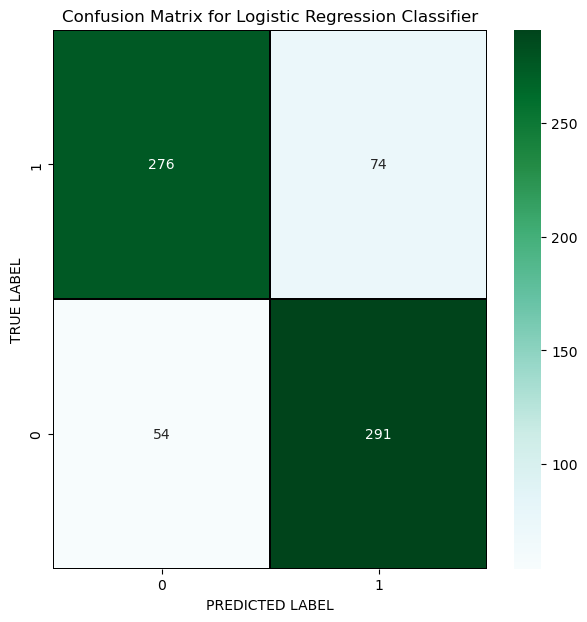

In [87]:
# Lets plot confusion matrix for Logistic Regression
cm = confusion_matrix(y_test,predLR)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
plt.show()

In [88]:
#DECISION TREE CLASSIFIER
# Checking Accuracy for Decision Tree Classifier
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)

#Prediction
predDTC = DTC.predict(x_test)

print(accuracy_score(y_test, predDTC))
print(confusion_matrix(y_test, predDTC))
print(classification_report(y_test,predDTC))

0.837410071942446
[[284  66]
 [ 47 298]]
              precision    recall  f1-score   support

           0       0.86      0.81      0.83       350
           1       0.82      0.86      0.84       345

    accuracy                           0.84       695
   macro avg       0.84      0.84      0.84       695
weighted avg       0.84      0.84      0.84       695



The Accuracy score for Decision tree classifier model is 84%.

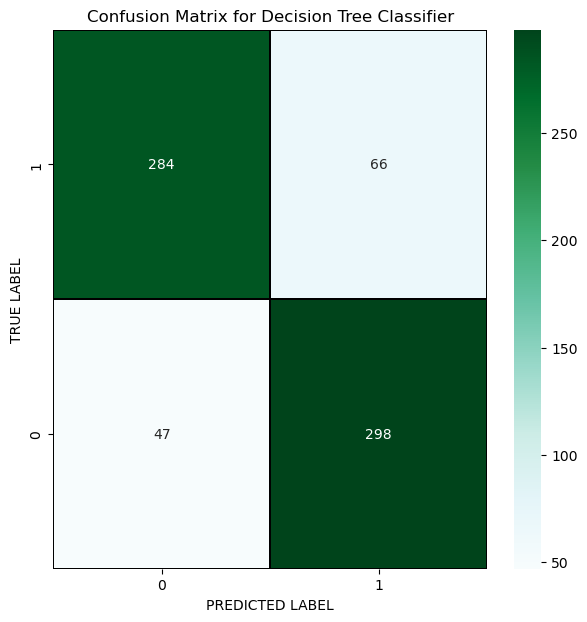

In [89]:
# Lets plot confusion matrix for DTC
cm = confusion_matrix(y_test,predDTC)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

In [100]:
#RANDOM FOREST CLASSIFIER
# Checking accuracy for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)

print(accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.939568345323741
[[335  15]
 [ 27 318]]
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       350
           1       0.95      0.92      0.94       345

    accuracy                           0.94       695
   macro avg       0.94      0.94      0.94       695
weighted avg       0.94      0.94      0.94       695



In [ ]:
The Accuracy score for Random Forest Classifier is 94%.

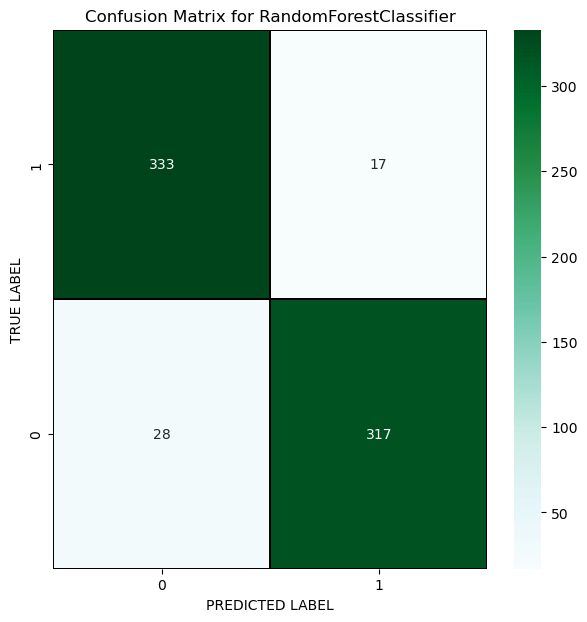

In [91]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()


In [92]:
#SUPPORT VECTOR MACHINE CLASSIFIER
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)

print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.8920863309352518
[[306  44]
 [ 31 314]]
              precision    recall  f1-score   support

           0       0.91      0.87      0.89       350
           1       0.88      0.91      0.89       345

    accuracy                           0.89       695
   macro avg       0.89      0.89      0.89       695
weighted avg       0.89      0.89      0.89       695



The accuracy score for SVC is 89%.

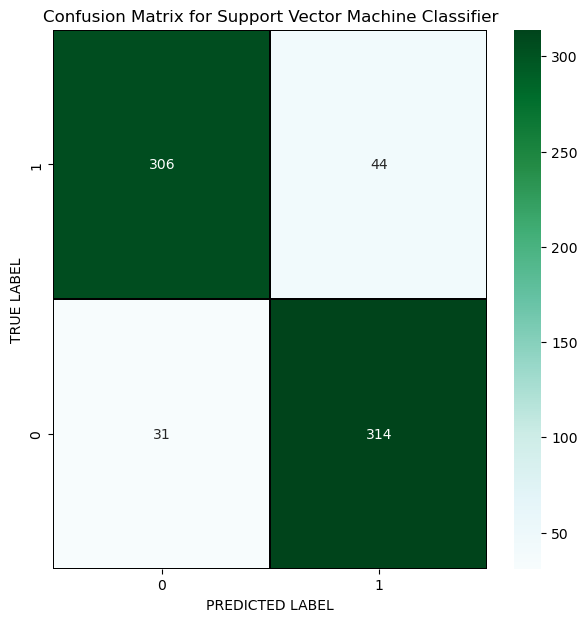

In [93]:
# Lets plot confusion matrix for Support Vector Machine Classifier
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

In [94]:
#KNN Classifiers
knn = KNN()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print(accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))

0.7913669064748201
[[213 137]
 [  8 337]]
              precision    recall  f1-score   support

           0       0.96      0.61      0.75       350
           1       0.71      0.98      0.82       345

    accuracy                           0.79       695
   macro avg       0.84      0.79      0.78       695
weighted avg       0.84      0.79      0.78       695



In [ ]:
The Accuracy score for KNN model is 79%.

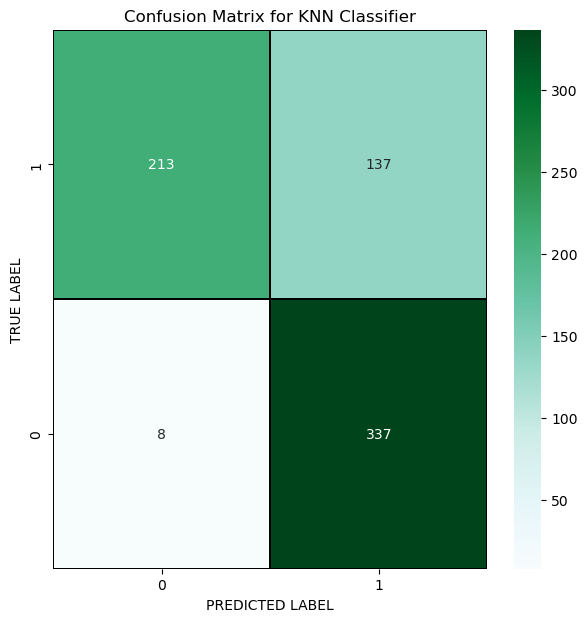

In [95]:
# Lets plot confusion matrix for KNN Classifier
cm = confusion_matrix(y_test,predknn)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNN Classifier')
plt.show()


In [96]:
#ADA Boost Classifier
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)

# Prediction
predABC = ABC.predict(x_test)

print(accuracy_score(y_test, predABC))
print(confusion_matrix(y_test, predABC))
print(classification_report(y_test,predABC))

0.8892086330935252
[[299  51]
 [ 26 319]]
              precision    recall  f1-score   support

           0       0.92      0.85      0.89       350
           1       0.86      0.92      0.89       345

    accuracy                           0.89       695
   macro avg       0.89      0.89      0.89       695
weighted avg       0.89      0.89      0.89       695



In [ ]:
The Accuracy score for ADA Boost Classifier is 89%.

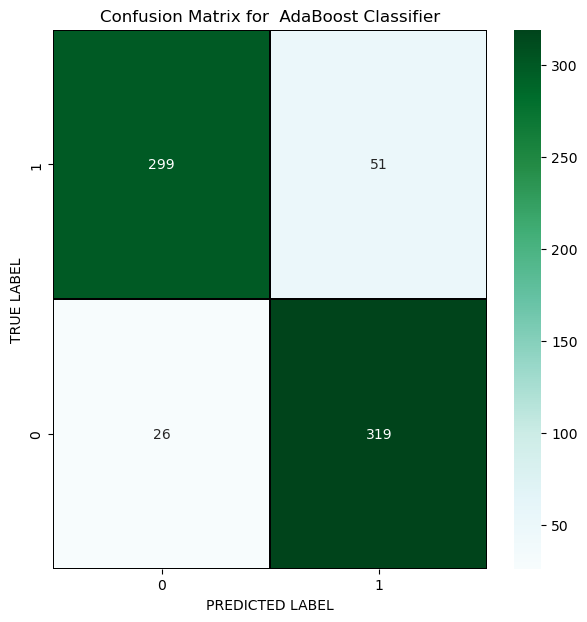

In [97]:
# Lets plot confusion matrix for  AdaBoost Classifier
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["0","1"]
y_axis_labels = ["1","0"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  AdaBoost Classifier')
plt.show()


In [98]:
# cv score for Logistic Regression Classifier
print(cross_val_score(LR,x,y,cv=5).mean())

# cv score for Decision Tree Classifier
print(cross_val_score(DTC,x,y,cv=5).mean())

# cv score for Random Forest Classifier
print(cross_val_score(RFC,x,y,cv=5).mean())

# cv score for Support Vector  Classifier
print(cross_val_score(svc,x,y,cv=5).mean())

# cv score for KNN Classifier
print(cross_val_score(knn,x,y,cv=5).mean())

# cv score for AdaBoosting Classifier
print(cross_val_score(ABC,x,y,cv=5).mean())

0.7988474715126238
0.8334205332538914
0.8969185223802786
0.8584605645341478
0.83117971251955
0.8360439785506815


After checking the Cross validation score, we find that Random Forst Classifier is our best model. 

In [103]:
#Hyper Parameter Tuning
model=RandomForestClassifier()
parameters = {'n_estimators':[100],
             'criterion':['gini'],
             'max_depth':[2,4,6]}

In [104]:
GCV=GridSearchCV(RFC,parameters,cv=5)

In [105]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini'], 'max_depth': [2, 4, 6],
                         'n_estimators': [100]})

In [106]:
GCV.best_params_

{'criterion': 'gini', 'max_depth': 6, 'n_estimators': 100}

In [107]:
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [108]:
Attrition = RandomForestClassifier(criterion='gini', max_depth=6, n_estimators=100)
Attrition.fit(x_train, y_train)
pred = Attrition.predict(x_test)
print(accuracy_score(y_test, predRFC))
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test,pred)))
print('R2_Score:',r2_score(y_test,pred)*100)

0.939568345323741
RMSE value: 0.3263047963850438
R2_Score: 57.407867494824025


The accuracy level is 94%, not much difference.

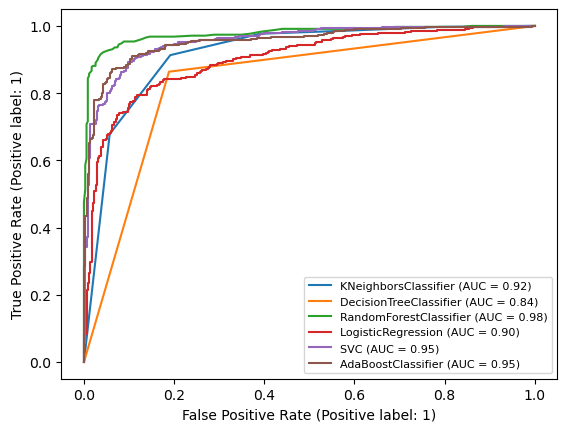

In [122]:
#Plotting ROC and AUC for the models 
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import RocCurveDisplay

fig, ax = plt.subplots()

metrics.RocCurveDisplay.from_estimator(knn,x_test,y_test,ax=ax)
metrics.RocCurveDisplay.from_estimator(DTC, x_test, y_test,ax=ax)    
metrics.RocCurveDisplay.from_estimator(RFC, x_test, y_test,ax=ax)
metrics.RocCurveDisplay.from_estimator(LR, x_test, y_test,ax=ax)
metrics.RocCurveDisplay.from_estimator(svc, x_test, y_test,ax=ax)
metrics.RocCurveDisplay.from_estimator(ABC, x_test, y_test,ax=ax)

plt.legend(prop={'size':8}, loc='lower right')
plt.show()

We can observe the various ROC curves, our best model RFC curve is green in colour with AUC of .98

In [123]:
# Saving the model using .pkl
import joblib
joblib.dump(Attrition,"HR analytics_Attrition.pkl")

['HR analytics_Attrition.pkl']

In [125]:
#Predicting the saved model
# Let's load the saved model and get the prediction

# Loading the saved model
model=joblib.load("HR analytics_Attrition.pkl")

#Prediction
prediction = model.predict(x_test)
prediction


array([0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0,

In [126]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,685,686,687,688,689,690,691,692,693,694
Predicted,0,1,0,0,1,0,0,1,1,1,...,0,1,0,0,1,0,1,0,1,1
Original,1,0,0,0,1,0,0,1,1,1,...,0,1,0,1,1,0,1,0,1,1


Model building is complete.
These are the predicted values in the fraction of the dataset.